In [1]:
import pandas as pd
import numpy as np 

In [2]:
train_data = pd.read_pickle('./raw_data/train.pickle')
test_data = pd.read_pickle('./raw_data/test.pickle')

In [3]:
train_data.cust_ip_no.unique()

array([ 8938., 10627., 11837.,  9834., 10554., 12170.,  8903.,  8182.,
        9365., 10468.,  8923., 11614.,  9366., 11677., 11860.,  8802.,
        8768., 11617., 12304., 12613.,  8859., 10630., 11693.,  8881.,
        8982.,  8939., 10682., 11707., 10529.,  8511., 12346.,  8259.,
        9564.,  9568., 10626., 12413., 11645., 10628.,  9806.,  8228.,
       10366., 10491., 10854., 11594., 11867., 10629.,  8879., 10889.,
       10579.,  8204.,  8258., 12243.,  8860., 10580., 10515.,  8187.,
       12169., 10683., 16444.,  9678.,  8902., 10625.,  8257.,  9343.,
       11854., 12244., 11784., 11983.,  9344., 10363., 10368.,  8943.,
       11857., 10892.,  9408., 11654.])

In [4]:
num_data = train_data.cust_ip_no.value_counts()

In [5]:
ip_list = []
for i in num_data.index:
    ip_list.append(str(i))

In [6]:
using_ip = []
for i, j in num_data.iteritems():
    if j >= 10079:
        using_ip.append(i)
        

In [7]:
test_data[test_data.event ==1].cust_ip_no.value_counts()

8939.0    42
8923.0    32
8938.0     4
Name: cust_ip_no, dtype: int64

In [8]:
using_ip

[8187.0,
 11784.0,
 10580.0,
 10515.0,
 10468.0,
 9366.0,
 10630.0,
 10683.0,
 9365.0,
 8938.0,
 8923.0,
 8902.0,
 11654.0,
 8879.0,
 10554.0,
 11707.0,
 8860.0,
 11837.0,
 8511.0,
 8257.0,
 12413.0,
 8258.0,
 8259.0,
 12243.0,
 11983.0,
 8768.0,
 11857.0,
 8182.0]

In [9]:
using_ip = [8187, 8902, 8182, 8939.0, 8923.0, 8938.0]

In [10]:
train_data[train_data.cust_ip_no.isin(using_ip)].groupby(['cust_ip_no','event']).cust_no.count().to_frame()

cust_no
cust_ip_no event         
8182.0     0.0      10079
8187.0     0.0      10079
8902.0     0.0      10079
8923.0     0.0      10037
           1.0         42
8938.0     0.0      10073
           1.0          6
8939.0     0.0      10049
           1.0         28

In [11]:
test_data[test_data.cust_ip_no.isin(using_ip)].groupby(['cust_ip_no','event']).cust_no.count().to_frame()

cust_no
cust_ip_no event         
8182.0     0.0      10078
8187.0     0.0      10078
8902.0     0.0      10078
8923.0     0.0      10046
           1.0         32
8938.0     0.0      10071
           1.0          4
8939.0     0.0      10004
           1.0         42

In [12]:
train_df = train_data[train_data.cust_ip_no.isin(using_ip)]
test_df = test_data[test_data.cust_ip_no.isin(using_ip)] 

In [13]:
train_list = [] 
for i in using_ip:
    df = train_df[train_df.cust_ip_no == i]
    df.reset_index(drop=True, inplace=True) 
    train_list.append(df)

In [14]:
test_list = []
for i in using_ip:
    df = test_df[test_df.cust_ip_no == i]
    df.reset_index(drop=True, inplace=True)
    test_list.append(df)

## Time gap check
- 데이터 간 시간의 차이가 발생하는 부분이 시퀀스 데이터에 들어가지 않도록 처리

In [15]:
from datetime import timedelta, datetime
gap_dic = {}
for ip in range(len(train_list)):
    gap_list = []
    for data in range(len(train_list[ip])-1):
        gap = (datetime.strptime(str(train_list[ip].stamp_inserted[data+1]),'%Y%m%d%H%M%S')) - (datetime.strptime(str(train_list[ip].stamp_inserted[data]),'%Y%m%d%H%M%S'))
        if gap > timedelta(minutes=1):
            gap_list.append((data))
    gap_dic[train_list[ip].cust_ip_no[0]] = gap_list

    
for ip in gap_dic.keys():
    gap_list = []
    for i in gap_dic[ip] :
        gap_num = i -9
        for j in range(10):
            gap_list.append(gap_num+j)
    gap_dic[ip] = gap_list
   

In [16]:
gap_dic_test = {}
for ip in range(len(test_list)):
    gap_list = []
    for data in range(len(test_list[ip])-1):
        gap = (datetime.strptime(str(test_list[ip].stamp_inserted[data+1]),'%Y%m%d%H%M%S')) - (datetime.strptime(str(test_list[ip].stamp_inserted[data]),'%Y%m%d%H%M%S'))
        if gap > timedelta(minutes=1):
            gap_list.append((data))
    gap_dic_test[test_list[ip].cust_ip_no[0]] = gap_list

    
for ip in gap_dic_test.keys():
    gap_list = []
    for i in gap_dic_test[ip] :
        gap_num = i -9
        for j in range(10):
            gap_list.append(gap_num+j)
    gap_dic_test[ip] = gap_list


In [17]:
from tqdm import tqdm
seq_time = 10
iv = [ 'bytes', 'pkts',
       'sip_entropy', 'dip_entropy', 'spt_entropy', 'dpt_entropy',
       'proto_entropy', 'icmp_ratio', 'tcp_ratio', 'udp_ratio',
       'tcp_flags_entropy', 'domestic_ratio']
features = len(iv)

normal_X = []
normal_y = [] 

for j in tqdm(range(len(train_list))):
    normal_data = pd.DataFrame(columns=iv)
    normal_label = []
    ip = list(gap_dic.keys())[j]
    gap = gap_dic[ip]
    for i in range(len(train_list[j]) - seq_time):
        if i not in gap:
            input_x = train_list[j].iloc[i:i+seq_time,3:-1]
            label = train_list[j].iloc[i+seq_time, -1]
            ip_NO = train_list[j].iloc[i+seq_time, 2]
            time = train_list[j].iloc[i+seq_time,0]

            if label == 0:
                normal_data = pd.concat([normal_data, input_x], axis=0)
                ip_label_set = (time, ip_NO, label)            
                normal_label.append(ip_label_set) 

                
    normal_X.append(normal_data) 
    normal_y.append(normal_label)     

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:18<00:00, 13.12s/it]


In [19]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))


X_normal = pd.DataFrame(columns=iv)
for i in normal_X:
    tmp_input = pd.DataFrame(scaler.fit_transform(i.values), columns=iv)
    X_normal = pd.concat([X_normal, tmp_input], axis=0)

y_normal = []
for i in normal_y:
    y_normal.extend(i)


In [20]:
X_normal = X_normal.values.reshape(-1, 10, 12) 
train_y_df = pd.DataFrame(y_normal, columns=['time','ip','label'])
train_y_df.head()

,time,ip,label
0,20200801001000,8187.0,0.0
1,20200801001100,8187.0,0.0
2,20200801001200,8187.0,0.0
3,20200801001300,8187.0,0.0
4,20200801001400,8187.0,0.0


In [21]:
X_8187 = X_normal[:10059]
y_8187 = train_y_df.iloc[:10059]

## Train : Convolutional AutoEncoder

In [25]:
from tensorflow.keras import Model, models, optimizers, utils, layers
from keras.layers import LSTM, Dense, Activation, Conv1D, Dropout, Conv1DTranspose, BatchNormalization
from keras.models import load_model
import keras.backend as K

adam = optimizers.Adam(lr=0.0001)
kernel_s = 3 
seq_time = 10

K.clear_session()
cnn_ae = models.Sequential([
    layers.Input(shape=(seq_time, features)),
    layers.Conv1D(filters=12, kernel_size=kernel_s, padding='same', strides=1),
    layers.BatchNormalization(),
    Activation('relu'),
    layers.Conv1D(filters=20, kernel_size=kernel_s, padding='same', strides=1),
    layers.BatchNormalization(), 
    Activation('relu'),
    layers.Conv1D(filters=40, kernel_size=kernel_s, padding='same', strides=1),
    layers.Conv1DTranspose(filters=40, kernel_size=kernel_s, padding='same', strides=1),
    layers.BatchNormalization(),
    Activation('relu'),
    layers.Conv1DTranspose(filters=20, kernel_size=kernel_s, padding='same', strides=1),
    layers.BatchNormalization(),
    Activation('relu'),
    layers.Conv1DTranspose(filters=12, kernel_size=kernel_s, padding='same'),
]) 

cnn_ae.compile(optimizer=adam, loss='mse') 

In [26]:
hist = cnn_ae.fit(X_normal, X_normal, epochs=30, validation_split=0.1, batch_size=16, shuffle=True, verbose=2)

Epoch 1/30
3390/3390 - 5s - loss: 0.0526 - val_loss: 0.0101
Epoch 2/30
3390/3390 - 4s - loss: 0.0113 - val_loss: 0.0045
Epoch 3/30
3390/3390 - 4s - loss: 0.0078 - val_loss: 0.0031
Epoch 4/30
3390/3390 - 4s - loss: 0.0064 - val_loss: 0.0024
Epoch 5/30
3390/3390 - 4s - loss: 0.0054 - val_loss: 0.0022
Epoch 6/30
3390/3390 - 4s - loss: 0.0047 - val_loss: 0.0019
Epoch 7/30
3390/3390 - 4s - loss: 0.0042 - val_loss: 0.0017
Epoch 8/30
3390/3390 - 4s - loss: 0.0038 - val_loss: 0.0016
Epoch 9/30
3390/3390 - 4s - loss: 0.0036 - val_loss: 0.0017
Epoch 10/30
3390/3390 - 4s - loss: 0.0034 - val_loss: 0.0016
Epoch 11/30
3390/3390 - 4s - loss: 0.0033 - val_loss: 0.0016
Epoch 12/30
3390/3390 - 4s - loss: 0.0031 - val_loss: 0.0015
Epoch 13/30
3390/3390 - 4s - loss: 0.0029 - val_loss: 0.0014
Epoch 14/30
3390/3390 - 4s - loss: 0.0028 - val_loss: 0.0015
Epoch 15/30
3390/3390 - 4s - loss: 0.0027 - val_loss: 0.0015
Epoch 16/30
3390/3390 - 4s - loss: 0.0026 - val_loss: 0.0013
Epoch 17/30
3390/3390 - 4s - loss

In [27]:
from plotly.offline import plot, iplot 
import plotly.graph_objects as go

loss = hist.history['loss'] 
val_loss = hist.history['val_loss'] 

fig = go.Figure()
fig.add_trace(go.Scatter(y=loss, mode='lines', name='loss')) 
fig.add_trace(go.Scatter(y=val_loss, mode='lines', name='val_loss'))
fig.update_layout(height=400, width=600, title='loss of CVAE')
fig.show() 

## Test : Next week data of each IP

In [28]:
from tqdm import tqdm

seq_time = 10
iv = [ 'bytes', 'pkts',
       'sip_entropy', 'dip_entropy', 'spt_entropy', 'dpt_entropy',
       'proto_entropy', 'icmp_ratio', 'tcp_ratio', 'udp_ratio',
       'tcp_flags_entropy', 'domestic_ratio']
features = len(iv)

X_ts = []
y_ts = [] 


for j in tqdm(range(len(test_list))):
    ts_data = pd.DataFrame(columns=iv)
    ts_label = []
    ip = list(gap_dic_test.keys())[j]
    gap = gap_dic_test[ip]
    
    
    for i in range(len(test_list[j]) - seq_time):
        if i not in gap:
            input_x = test_list[j].iloc[i:i+seq_time,3:-1] 
            label = test_list[j].iloc[i+seq_time, -1]
            ip_NO = test_list[j].iloc[i+seq_time, 2]  
            time = test_list[j].iloc[i+seq_time, 0]
            
            ts_data = pd.concat([ts_data, input_x], axis=0)
            ip_label_set = (time, ip_NO, label)            
            ts_label.append(ip_label_set)         
        else: 
            pass
            
    X_ts.append(ts_data) 
    y_ts.append(ts_label) 
    

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:18<00:00, 13.10s/it]


In [29]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))


X_ts_ = pd.DataFrame(columns=iv)
for i in X_ts:
    tmp_input = pd.DataFrame(scaler.fit_transform(i.values), columns=iv)
    X_ts_ = pd.concat([X_ts_, tmp_input], axis=0)

y_ts_ = [] 
for i in y_ts:
    y_ts_.extend(i)

 

In [35]:
X_ts = X_ts_.values.reshape(-1, 10, 12) 
y_ts = pd.DataFrame(y_ts_, columns=['time','ip','label'])

In [36]:
pred_x = cnn_ae.predict(X_normal).reshape(X_normal.shape[0],-1)
real = X_normal.reshape(X_normal.shape[0], -1) 
log_mse = np.log(np.mean(np.power(real-pred_x, 2), axis=1)) 
mse = np.mean(np.power(real-pred_x, 2), axis=1)
train_df_error = pd.DataFrame({'time':train_y_df.time, 'recon_size':mse, 'IP':train_y_df.ip, 'reconstruction_error':log_mse, 'Label':train_y_df.label})


## Optimal threshold 

In [37]:
thr = train_df_error[['reconstruction_error','Label']].describe()
error = sorted(train_df_error.reconstruction_error.values, reverse=True)

up_to_99_5 = int(round(len(error) * 0.005,0)) 
up_to_99_5

threshold = error[up_to_99_5]
max_error = error[0]
print(thr)
print(threshold) 

       reconstruction_error    Label
count          60256.000000  60256.0
mean              -7.240229      0.0
std                0.822574      0.0
min               -9.294055      0.0
25%               -7.732622      0.0
50%               -7.177091      0.0
75%               -6.744313      0.0
max               -3.127641      0.0
-4.459400191412044


## Detection result

In [42]:
from sklearn.metrics import confusion_matrix, classification_report

pred_x = cnn_ae.predict(X_ts).reshape(X_ts.shape[0],-1)
real = X_ts.reshape(X_ts.shape[0], -1)
log_mse = np.log(np.mean(np.power(real-pred_x, 2), axis=1))
mse = np.mean(np.power(real-pred_x, 2), axis=1)
test_df_error = pd.DataFrame({'time':y_ts.time, 'reconstruction_error':log_mse, 'recon_size':mse, 'Label':y_ts.label, 'IP':y_ts.ip})
test_ddos = test_df_error[test_df_error.Label==1]
test_normal = test_df_error[test_df_error.Label==0]  

# ddos_num = len(test_ddos) 
# if ddos_num > 10: 
#     random_count = int(round(ddos_num*0.1,0))
#     sampled_idx = list(np.random.randint(ddos_num, size=(random_count)))
#     sampled_threshold = [test_ddos.iloc[i,0] for i in sampled_idx]
#     difference = [i-threshold for i in sampled_threshold]
#     safe_line = max_error - threshold
#     if min(difference) > safe_line:
#         new_threshold = max_error
#         pred_y = [1 if e > threshold else 0 for e in test_df_error['reconstruction_error'].values]
#         print(threshold)
#     else:
#         pred_y = [1 if e > threshold else 0 for e in test_df_error['reconstruction_error'].values]
# else:

pred_y = [1 if e > threshold else 0 for e in test_df_error['reconstruction_error'].values]
confusion_m = confusion_matrix(y_ts.label, pred_y)
classification = classification_report(y_ts.label, pred_y)
test_df_error['predicted_y'] = pred_y
print(confusion_m)
print(classification)

# 성능 쿠레이지... ㅜㅜ

[[57025  3074]
 [   17    61]]
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97     60099
         1.0       0.02      0.78      0.04        78

    accuracy                           0.95     60177
   macro avg       0.51      0.87      0.51     60177
weighted avg       1.00      0.95      0.97     60177



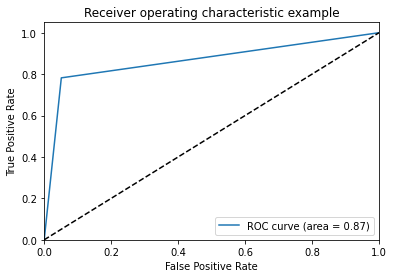

In [41]:
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, auc, roc_curve

fpr, tpr, thresholds = roc_curve(test_df_error.Label, pred_y)
roc_auc = auc(fpr, tpr)

plt.figure() 
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right") 
plt.show()

In [43]:
import plotly.figure_factory as ff

test_ddos = test_df_error[test_df_error.Label ==1 ]
test_normal = test_df_error[test_df_error.Label ==0 ]
data = [train_df_error.reconstruction_error, test_ddos.reconstruction_error, test_normal.reconstruction_error]
group = ['train normal', 'test ddos', 'test normal'] 
fig = ff.create_distplot(data, group, bin_size=[.2,.2,.2])
fig.update_layout(title='Reconstruction distribution') 
fig.show() 


'''
학습 데이터의 정상과 디도스 데이터의 분포는 멀게 잡혔으나, 
테스트 데이터의 정상의 복원율이 현저히 떨어지는 것이 성능 저하의 원인이군..!
전주 정상 넷플로우와 차주 정상 넷플로우의 양상이 비슷하지 않은 것으로 파악됨 
'''